<a href="https://colab.research.google.com/github/Matsumo-chi/ActionGame/blob/master/Detectron2GrapesCount.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

     |████████████████████████████████| 274 kB 8.6 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=6d09dfb436755331e0d0b5d33175d87aa0bc8e99a3e68986cec9c42d3b708c00
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html
     |████████████████████████████████| 7.0 MB 5.2 MB/s 
     |████████████████████████████████| 49 kB 3.5 MB/s 
     |████████████████████████████████| 130 kB 15.1 MB/s 
     |████████████████████████████████| 74 kB 4.3 MB/s 
     |████████████████████████████████| 145 kB 67.6 MB/s 
     |████████████████████████████████| 749 kB 53.5 MB/s 
     |███████████████████████████████

In [1]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Train on a custom dataset

このセクションでは、既存のdetectron2モデルを、新しいフォーマットのカスタムデータセットで学習する方法を紹介します。

ここでは、[バルーンセグメンテーションデータセット](https://github.com/matterport/Mask_RCNN/tree/master/samples/balloon)を使用します。
を使います。
ここでは、detectron2のmodel zooにあるCOCOデータセットで事前に学習された既存のモデルから、バルーンセグメンテーションモデルを学習します。

COCOデータセットには "balloon "というカテゴリがないことに注意してください。この新しいクラスを数分で認識できるようにします。

## データセットの準備

detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html)に従って、detectron2にバルーンデータセットを登録します。
ここでは、データセットが独自の形式であるため、それを解析してdetectron2の標準形式に整える関数を書いています。カスタムフォーマットのデータセットを使うときは、このような関数を書く必要があります。詳しくは、チュートリアルをご覧ください。


In [2]:
# download, decompress the data
!wget https://github.com/Matsumo-chi/BerryCounting/blob/main/images.zip?raw=true -q -O images.zip
!unzip images.zip > /dev/null

In [3]:
# データセットがCOCOフォーマットの場合、このセルは以下の3行で置き換えることができます。
from detectron2.data.datasets import register_coco_instances
register_coco_instances("grapes_dataset_train", {}, "images/json_annotation_train.json", "images/train")
register_coco_instances("grapes_dataset_val", {}, "images/json_annotation_val.json", "images/val")
grapes_metadata = MetadataCatalog.get("grapes_dataset_train")
dataset_dicts = DatasetCatalog.get("grapes_dataset_train")

[12/05 06:02:19 d2.data.datasets.coco]: Loaded 45 images in COCO format from images/json_annotation_train.json


データの読み込みが正しいことを確認するために、トレーニングセットの中からランダムに選んだサンプルのアノテーションを可視化してみましょう。



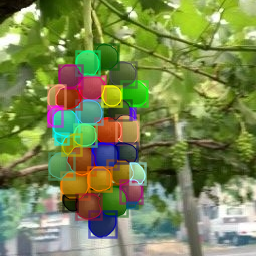

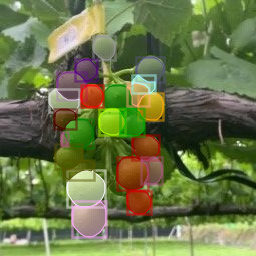

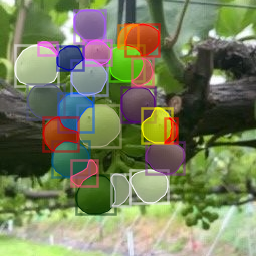

In [4]:
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=grapes_metadata, scale=1.0)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

## Train!

それでは、COCOでトレーニングしたR50-FPN Mask R-CNNモデルを風船データセットで微調整してみましょう。P100 GPUで300イテレーションのトレーニングを行うのに約2分かかります。


In [5]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("grapes_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # モデルzooからトレーニングを初期化させる
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0002  # 厳選されたLR　0.00025
cfg.SOLVER.MAX_ITER = 1000    # このおもちゃのデータセットでは300回の反復で十分だと思いますが、実用的なデータセットではもっと長い時間訓練する必要があります。
cfg.SOLVER.STEPS = []        # do not decay 学習率
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # の方が高速で、このトイデータセットには十分な性能を持っています（デフォルト：512）
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# 注：この設定はクラスの数を意味しますが、いくつかの人気のある非公式チュートリアルでは、num_classes+1をここで使用しています。

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[12/05 06:02:40 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:02, 85.1MB/s]                          
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to in

[12/05 06:02:47 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[12/05 06:02:53 d2.utils.events]:  eta: 0:05:17  iter: 19  total_loss: 2.886  loss_cls: 0.6818  loss_box_reg: 0.7766  loss_mask: 0.6953  loss_rpn_cls: 0.6525  loss_rpn_loc: 0.1034  time: 0.3220  data_time: 0.0153  lr: 3.9962e-06  max_mem: 2259M
[12/05 06:03:00 d2.utils.events]:  eta: 0:05:08  iter: 39  total_loss: 2.571  loss_cls: 0.6623  loss_box_reg: 0.7973  loss_mask: 0.684  loss_rpn_cls: 0.3465  loss_rpn_loc: 0.09369  time: 0.3201  data_time: 0.0075  lr: 7.9922e-06  max_mem: 2259M
[12/05 06:03:06 d2.utils.events]:  eta: 0:05:02  iter: 59  total_loss: 2.346  loss_cls: 0.6195  loss_box_reg: 0.8248  loss_mask: 0.6594  loss_rpn_cls: 0.1669  loss_rpn_loc: 0.09228  time: 0.3202  data_time: 0.0069  lr: 1.1988e-05  max_mem: 2259M
[12/05 06:03:13 d2.utils.events]:  eta: 0:04:55  iter: 79  total_loss: 2.238  loss_cls: 0.5798  loss_box_reg: 0.8079  loss_mask: 0.631  loss_rpn_cls: 0.1211  loss_rpn_loc: 0.091  time: 0.3192  data_time: 0.0086  lr: 1.5984e-05  max_mem: 2259M
[12/05 06:03:19 d2.ut

In [9]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## 学習済みモデルによる推論と評価
それでは、バルーン検証データセットを使って、学習したモデルを使った推論を行ってみましょう。まず、先ほど学習したモデルを使ってプレディクタを作成しましょう。



In [6]:
# 推論はトレーニングで使用されるパラメータを持つコンフィグを使用すべきである
# cfgにはこれまでに設定した内容がすべて含まれています。推論のために少しだけ変更しました。
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # 先ほど学習したモデルへのパス
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # カスタムテスト閾値の設定
predictor = DefaultPredictor(cfg)

そして、いくつかのサンプルをランダムに選択して、予測結果を視覚化します。

[12/05 06:08:07 d2.data.datasets.coco]: Loaded 12 images in COCO format from images/json_annotation_val.json


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


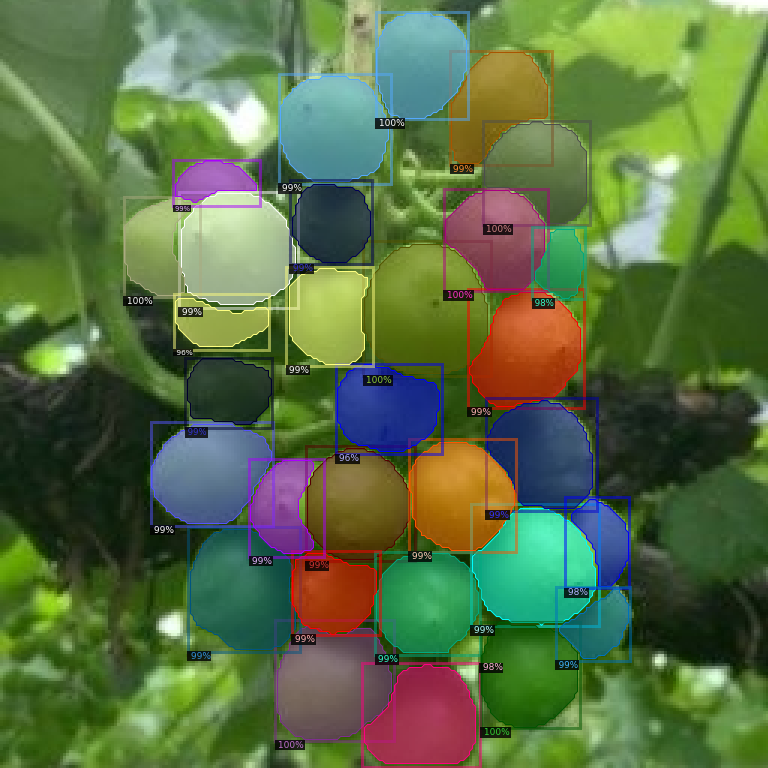

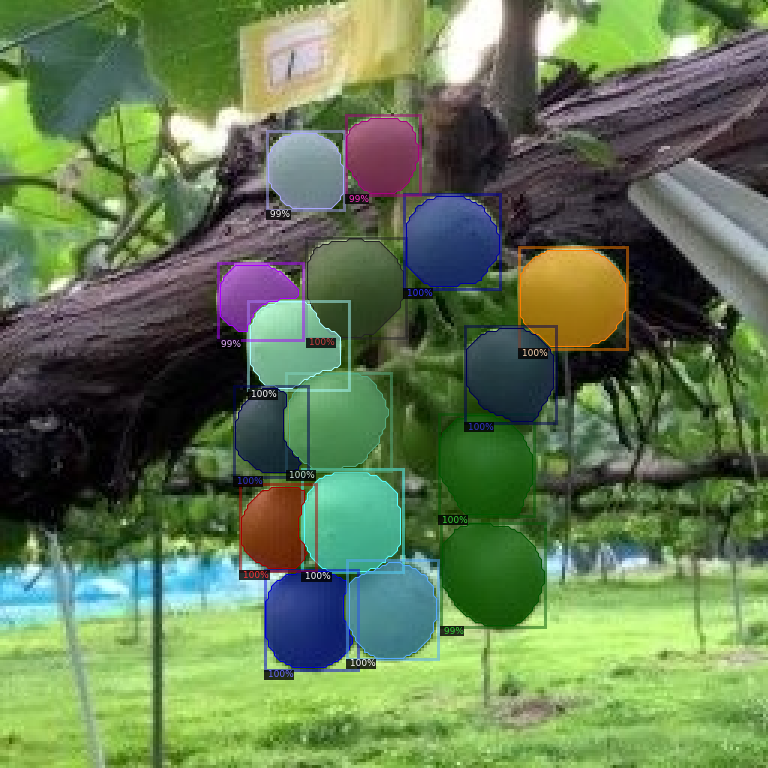

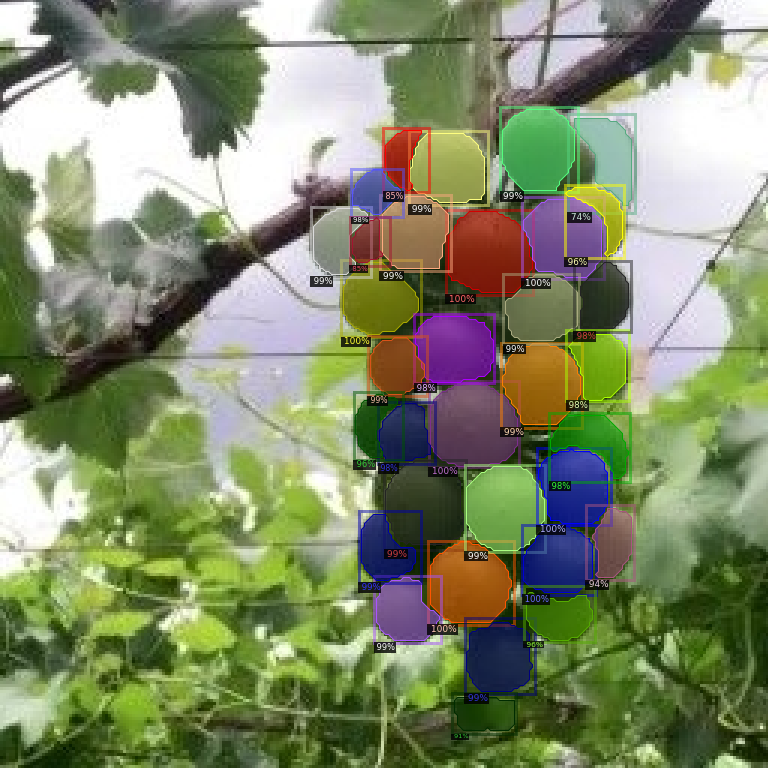

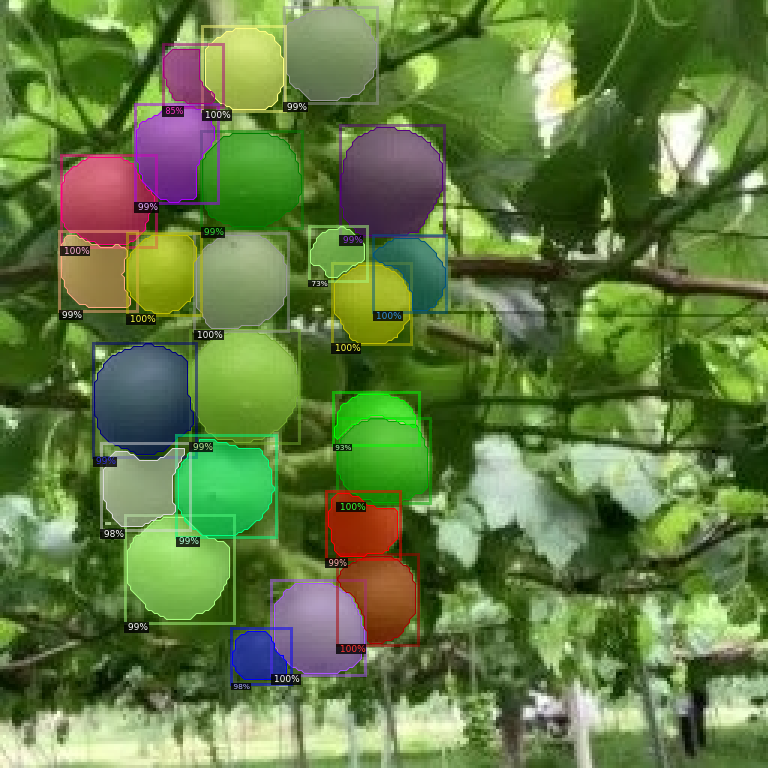

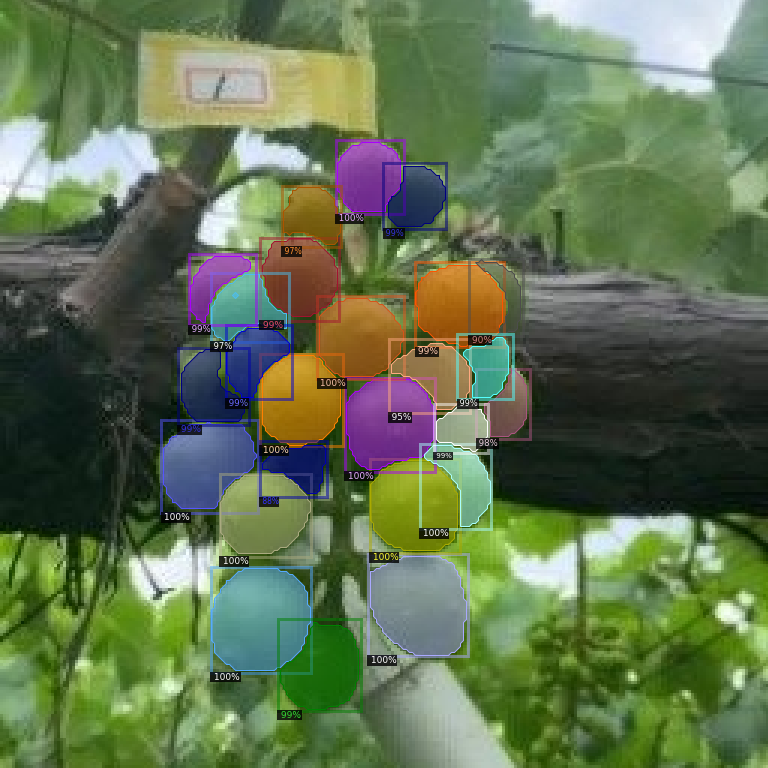

...

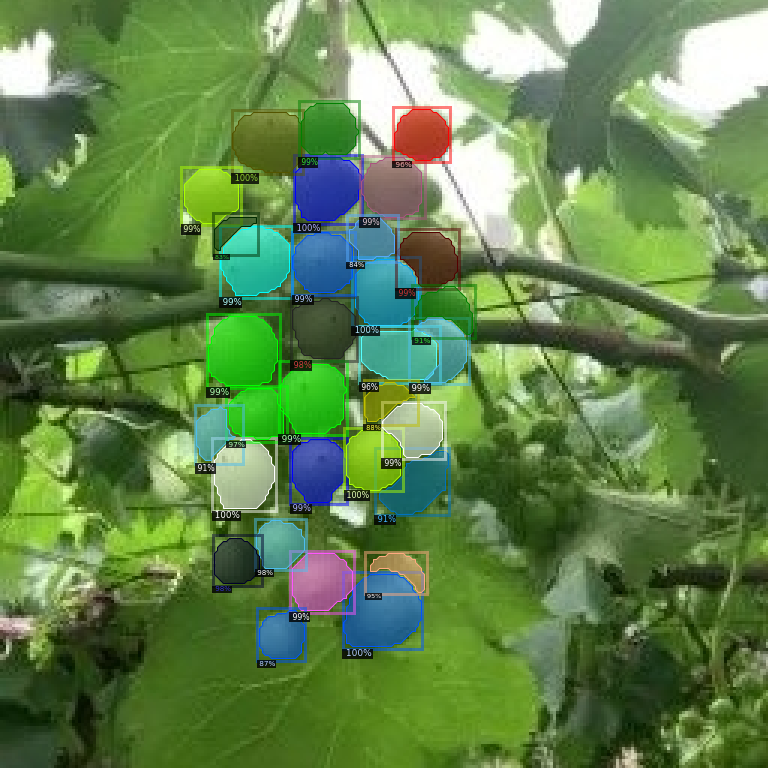

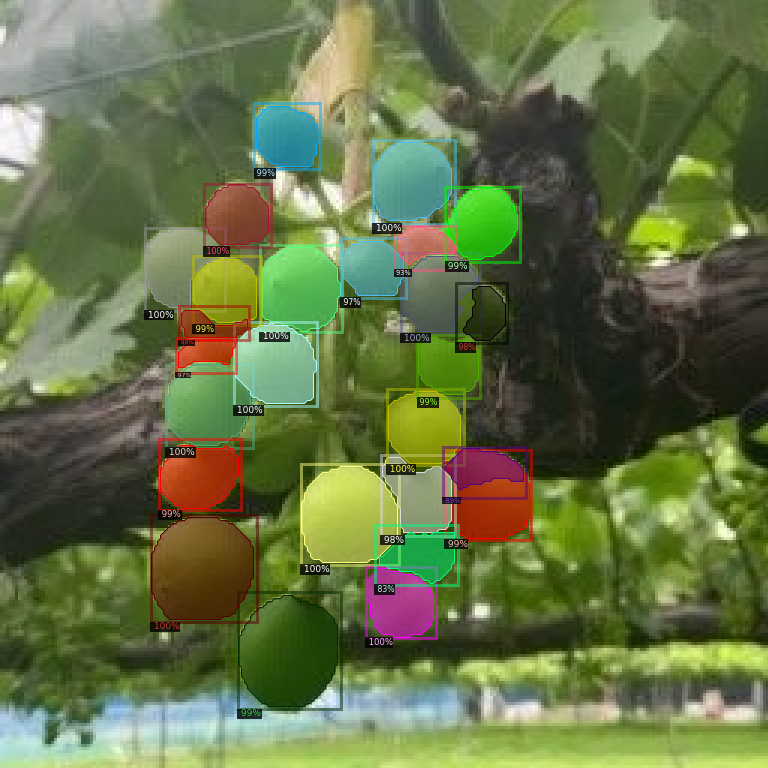

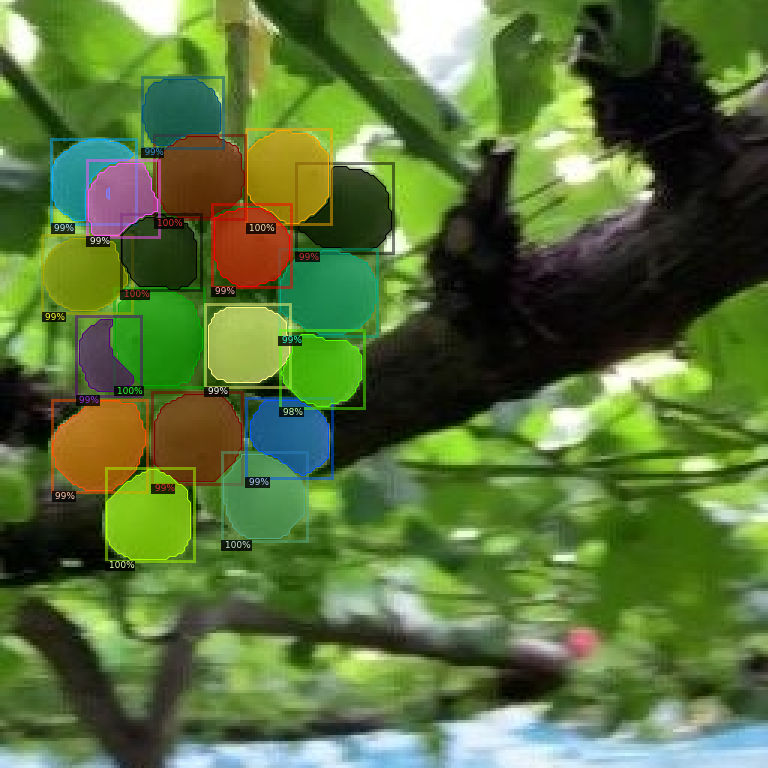

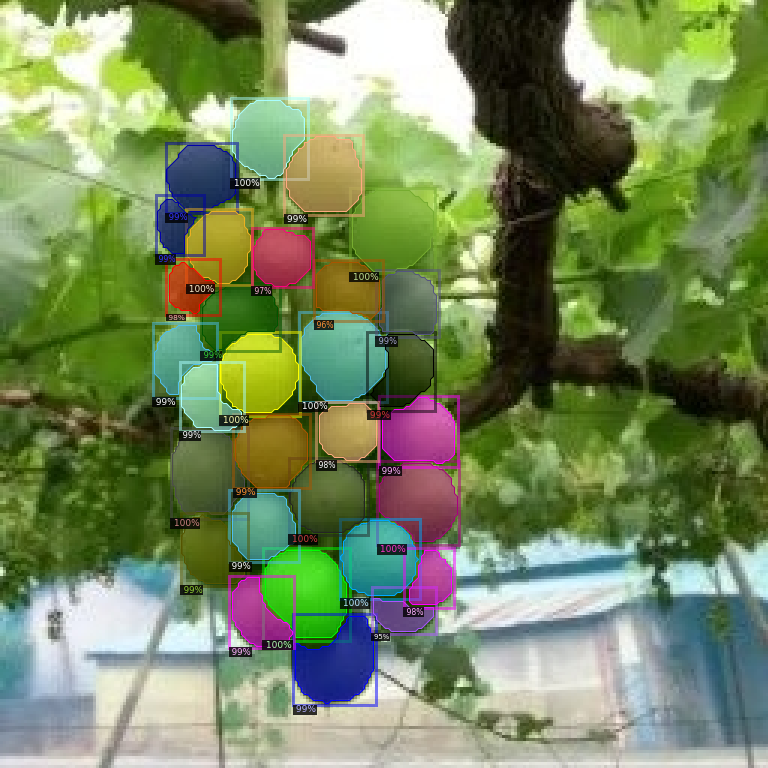

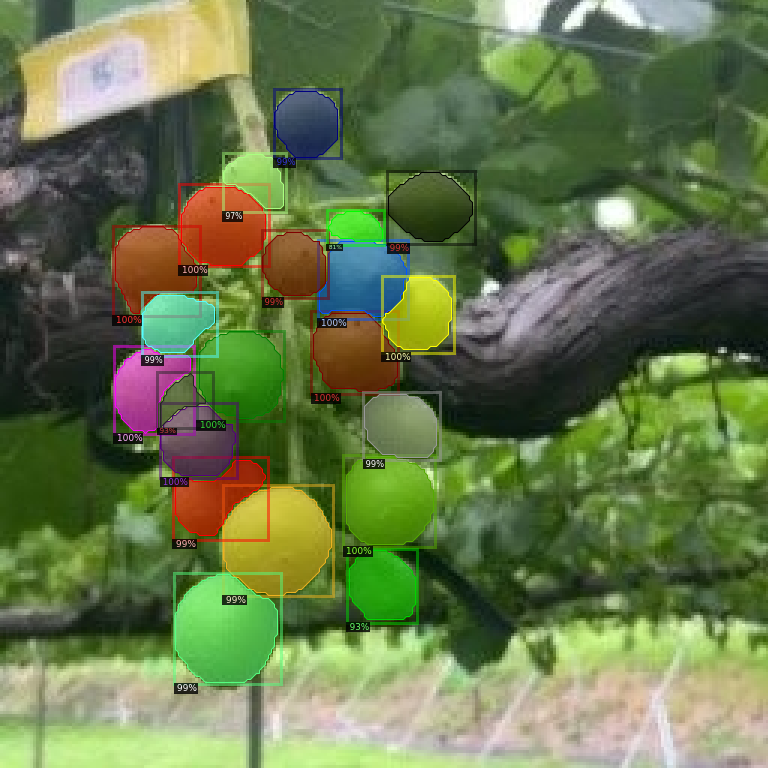

In [7]:
from detectron2.utils.visualizer import ColorMode
grapes_metadata = MetadataCatalog.get("grapes_dataset_val")
dataset_dicts = DatasetCatalog.get("grapes_dataset_val")

for d in random.sample(dataset_dicts, 12):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=grapes_metadata, 
                   scale=3, 
                   #instance_mode=ColorMode.IMAGE_BW   # は、セグメント化されていないピクセルの色を取り除きます。このオプションは、セグメンテーションモデルでのみ利用可能です。
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

また、COCO APIに実装されているAPメトリックを使って、その性能を評価することもできます。
これにより、APは約70となりました。悪くないですね。

In [8]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("grapes_dataset_val", output_dir="/output")
val_loader = build_detection_test_loader(cfg, "grapes_dataset_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[12/05 06:08:11 d2.data.datasets.coco]: Loaded 12 images in COCO format from images/json_annotation_val.json
[12/05 06:08:11 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|            | 330          |
|            |              |
[12/05 06:08:11 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/05 06:08:11 d2.data.common]: Serializing 12 elements to byte tensors and concatenating them all ...
[12/05 06:08:11 d2.data.common]: Serialized dataset takes 0.05 MiB
[12/05 06:08:11 d2.evaluation.evaluator]: Start inference on 12 batches


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[12/05 06:08:12 d2.evaluation.evaluator]: Inference done 11/12. Dataloading: 0.0009 s/iter. Inference: 0.0541 s/iter. Eval: 0.0050 s/iter. Total: 0.0601 s/iter. ETA=0:00:00
[12/05 06:08:12 d2.evaluation.evaluator]: Total inference time: 0:00:00.476147 (0.068021 s / iter per device, on 1 devices)
[12/05 06:08:12 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.054012 s / iter per device, on 1 devices)
[12/05 06:08:12 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/05 06:08:12 d2.evaluation.coco_evaluation]: Saving results to /output/coco_instances_results.json
[12/05 06:08:12 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[12/05 06:08:12 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[12/05 06:08:12 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[12/05 06:08:12 d2.evaluation.f